<a href="https://colab.research.google.com/github/shindeshu/gnn-intro-examples/blob/main/gnn_from_scratch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Implementing GNN from Scratch

In this notebook we'll try to implement a simple message passing neural network (Graph Convolution Layer) from scratch, and a step-by-step introduction to the topic.

If you are unfamiliar with GNNs in general, please go through my small [intro blogpost](https://shindeshu.github.io/gnn_posts/intro_gnn.html). Message Passing is one of the more popular concepts in GNNs, and that is what we'll try to implement here. Specifically we are implementing the Graph Convolutional Layer/Network proposed by Kipf et al in 2016. You can go through a detailed [blogpost](https://tkipf.github.io/graph-convolutional-networks/) of his or the [original paper](https://arxiv.org/abs/1609.02907).



## Representing a Graph

Before we start on to Graph convolutions, let's first present it out on how do we represent a graph in code. Mathematically, a graph is defined as a tuple of a set of nodes/vertices $V$, and a set of edges/links $E$: $\mathcal{G}=(V,E)$. Further, each edge is a pair of two vertices, and represents a connection between them.

Visually, a graph would look something like this: 

<center width="100%" style="padding:10px"><img src="https://www.researchgate.net/profile/Wei-Dong-51/publication/235973074/figure/fig1/AS:393538677297153@1470838340530/A-small-example-graph-representation-of-a-network-with-8-nodes-and-14-undirected-edges.png" width="350px"></center>

The vertices are $V=\{1,2,3,4,5,6,7,8\}$, and edges $E=\{(1,5), (2,1), (2,8), (3,4), ...\}$

There are many ways to represent graphs in memory- two of them include "adjacency matrix" ($a$) and "edge list". If the number of nodes is $n$, the adjacency matrix is $n \times n$. If there's an edge from node $n_i$ to $n_j$, the element $a_{ij}$ is equal to 1. Likewise, the other elements of $a$ are populated.

$$
A = \begin{bmatrix}
    0 & 1 & 0 & 0\\
    1 & 0 & 1 & 1\\
    0 & 1 & 0 & 1\\
    0 & 1 & 1 & 0
\end{bmatrix}
$$

Working with adjacency matrix for graph operations is easier, although they have their limitations. While established libraries like ```dgl``` or ```pytorch-geometric``` use edge-list format of data, here we are working with an adjacency matrix.

## Graph Convolutions

Graph convolutions are somewhat similar to image convolutions, in that they take their neighbourhood information and aggregate to get a richer understanding of their position. Also, the "parameters" of the filters are shared across the entire image, which is analogous to a graph convolution as well, where the parameters are shared across the graph.

GCNs rely on the message passing paradigm. Each node has a feature vector associated with it. For a given node $u$, each of its neighbouring nodes $v_i$ send a message derived from its feature vector to it. All these messages are aggregated alongwith its own feature vector, and this is used to update this node $u$ to get the final feature vector (or embedding).

## Current Implementation 

Each node has a feature vector. This feature will be projected using a linear layer, output of which will be the message that each node passes. We will represent the graph as an adjacency matrix, and multiply by the node features (projected) to perform the message passing. This will be divided by the number of neighbours for normalizing, which will give us the output of our first graph convolution layer.

Importing all our libraries. We are not using libraries like ```dgl``` or ```pytorch-geometric```, we will be using plain pytorch. We are also using ```networkx``` for manipulating graph.

In [76]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import torch.optim as optim
import networkx as nx
device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
print(device)

cpu


We will be a creating a random matrix as an adjacency matrix. Creating a matrix with uniform_ method and the bernoulli method.

In [134]:
nodes = 10
node_features_size = 4

In [135]:
adj = torch.empty(nodes, nodes).uniform_(0, 1).bernoulli()

In [136]:
adj

tensor([[0., 1., 0., 0., 1., 0., 0., 0., 1., 0.],
        [0., 0., 1., 0., 1., 0., 0., 1., 0., 1.],
        [0., 1., 0., 1., 0., 0., 1., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
        [0., 1., 0., 1., 1., 1., 1., 0., 0., 0.],
        [0., 1., 1., 0., 1., 0., 1., 0., 1., 1.],
        [1., 0., 1., 1., 0., 0., 1., 0., 1., 1.],
        [0., 1., 1., 1., 1., 1., 0., 1., 0., 1.],
        [0., 0., 0., 0., 0., 0., 1., 1., 0., 1.],
        [0., 0., 0., 1., 0., 0., 0., 1., 1., 1.]])

Visualizing the graph we created with networkx library

In [137]:
graph = nx.from_numpy_matrix(adj.numpy())
graph.remove_edges_from(nx.selfloop_edges(graph))

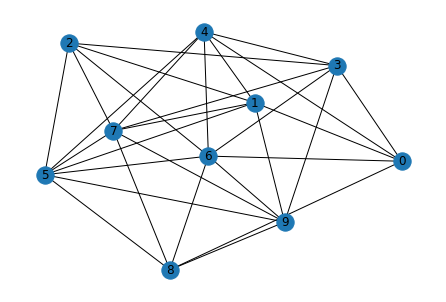

In [138]:
pos = nx.kamada_kawai_layout(graph)
nx.draw(graph, pos, with_labels=True)

Creating random features for our nodes. These features will go through a dense layer and then act as our messages.

In [148]:
node_features = torch.empty(nodes, node_features_size).uniform_(0, 1).bernoulli()#.view(1, nodes, node_features_size)
node_features

tensor([[1., 1., 0., 1.],
        [1., 1., 1., 0.],
        [1., 1., 1., 0.],
        [0., 1., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 1., 1.],
        [0., 1., 0., 1.],
        [1., 1., 0., 1.],
        [1., 0., 1., 1.]])

The features will pass through a linear layer to create our messages

In [140]:
projector = nn.Linear(node_features_size, 5)

In [141]:
node_feat_proj = projector(node_features)

In [142]:
num_neighbours = adj.sum(dim=-1, keepdims=True)
num_neighbours

tensor([[3.],
        [4.],
        [3.],
        [2.],
        [5.],
        [6.],
        [6.],
        [7.],
        [3.],
        [4.]])

In [149]:
torch.matmul(adj, node_feat_proj)/num_neighbours

tensor([[-0.5067, -0.2463, -0.0555,  0.2188,  0.4031],
        [-0.8397,  0.0945,  0.5124,  0.1179, -0.0296],
        [-0.6457,  0.2369,  0.5048, -0.0216,  0.1531],
        [-0.9893,  0.4223,  0.7235,  0.3212, -0.1165],
        [-0.5876,  0.2246,  0.5227, -0.1519,  0.1979],
        [-0.6133, -0.0359,  0.2532,  0.0760,  0.2250],
        [-0.7740,  0.2055,  0.5252,  0.1075,  0.0174],
        [-0.7827,  0.1653,  0.5654,  0.0135, -0.0155],
        [-0.8635,  0.3189,  0.6940,  0.0758, -0.0423],
        [-0.9374,  0.2670,  0.6672,  0.1805, -0.1292]], grad_fn=<DivBackward0>)

In [144]:
adj.shape, node_feat_proj.shape

(torch.Size([10, 10]), torch.Size([10, 5]))

## A Note on Above Multiplication Operation

How it does achieve our objective, i.e. summing up of messages from neighbouring nodes of a particular node?

For simplicity, lets take an example where the adj matrix is $ 7 \times 7$ and the message matrix is $ 7 \times 5 $.

Consider a single row from the adjacency matrix, that corresponds to a node $n_i$. It might look something like
$$
A = \begin{bmatrix}
    0 & 1 & 0 & 0 & 1 & 0 & 1\\
\end{bmatrix}
$$

And the message matrix is $7 \times 5$. (seven rows, five columns).

For this node, we can observe there are edges existent only for nodes ${2, 5, 7}$. When we multiple the above matrix with the message/feature matrix, we will get the elements corresponding to those indexes summed up (since others are multiplied by zero), along the second axis of the feature matrix i.e. we will get a $1 \times 5$ size vector.

Here, you can see that only the neighbouring nodes' features have been summed up to get the final d-length vector.


## Putting It All Together

Now that we've done it step-by-step, let us aggregate the operations together in proper functions.

In [150]:
class GCNLayer(nn.Module):
    def __init__(self, in_feat, out_feat):
        super().__init__()
        self.projector = nn.Linear(in_feat, out_feat)

    def forward(self, node_features, adj):
        num_neighbours = adj.sum(dim=-1, keepdims=True)
        node_features = torch.relu(self.projector(node_features))
        node_features = torch.matmul(adj, node_features)
        node_features = node_features / num_neighbours
        node_features = torch.relu(node_features)
        return node_features

In [151]:
layer1 = GCNLayer(node_features_size, 8)
layer1(node_features, adj).shape

torch.Size([10, 8])

In [154]:
layer2 = GCNLayer(8, 2)
layer2(layer1(node_features, adj), adj)

tensor([[0.4279, 0.4171],
        [0.4724, 0.4304],
        [0.4318, 0.3761],
        [0.4315, 0.3860],
        [0.4520, 0.4132],
        [0.4449, 0.4049],
        [0.4346, 0.3827],
        [0.4614, 0.4176],
        [0.4446, 0.3860],
        [0.4068, 0.3582]], grad_fn=<ReluBackward0>)

In [155]:
class GCNmodel(nn.Module):
    def __init__(self, in_feat, hid_feat, out_feat):
        super().__init__()
        self.gcn_layer1 = GCNLayer(in_feat, hid_feat)
        self.gcn_layer2 = GCNLayer(hid_feat, out_feat)

    def forward(self, node_features, adj):
        h = self.gcn_layer1(node_features, adj)
        h = self.gcn_layer2(h, adj)
        return h

In [156]:
model = GCNmodel(node_features_size, 12, 2)

In [157]:
model(node_features, adj)

tensor([[0.0000, 0.0000],
        [0.0000, 0.0000],
        [0.0000, 0.0077],
        [0.0000, 0.0000],
        [0.0000, 0.0046],
        [0.0000, 0.0000],
        [0.0000, 0.0038],
        [0.0000, 0.0033],
        [0.0000, 0.0000],
        [0.0000, 0.0058]], grad_fn=<ReluBackward0>)

## Solving a Real Problem

Now that we are able to play around with random data, lets us get to work on some real datasets that we can do basic classification problems on. We will be using the zachary's karate club dataset, which is a small dataset of 34 people and the edges include their observed interactions with each other. Our objective: predict which group will each of the people go to once their club is bisected.

In [158]:
def build_karate_club_graph():
    g = nx.Graph()
    edge_list = [(1, 0), (2, 0), (2, 1), (3, 0), (3, 1), (3, 2),
        (4, 0), (5, 0), (6, 0), (6, 4), (6, 5), (7, 0), (7, 1),
        (7, 2), (7, 3), (8, 0), (8, 2), (9, 2), (10, 0), (10, 4),
        (10, 5), (11, 0), (12, 0), (12, 3), (13, 0), (13, 1), (13, 2),
        (13, 3), (16, 5), (16, 6), (17, 0), (17, 1), (19, 0), (19, 1),
        (21, 0), (21, 1), (25, 23), (25, 24), (27, 2), (27, 23),
        (27, 24), (28, 2), (29, 23), (29, 26), (30, 1), (30, 8),
        (31, 0), (31, 24), (31, 25), (31, 28), (32, 2), (32, 8),
        (32, 14), (32, 15), (32, 18), (32, 20), (32, 22), (32, 23),
        (32, 29), (32, 30), (32, 31), (33, 8), (33, 9), (33, 13),
        (33, 14), (33, 15), (33, 18), (33, 19), (33, 20), (33, 22),
        (33, 23), (33, 26), (33, 27), (33, 28), (33, 29), (33, 30),
        (33, 31), (33, 32)]
    g.add_edges_from(edge_list)
    return g

In [159]:
g = build_karate_club_graph()

In [160]:
g.nodes()

NodeView((1, 0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 16, 17, 19, 21, 25, 23, 24, 27, 28, 29, 26, 30, 31, 32, 14, 15, 18, 20, 22, 33))

In [161]:
g.edges()

EdgeView([(1, 0), (1, 2), (1, 3), (1, 7), (1, 13), (1, 17), (1, 19), (1, 21), (1, 30), (0, 2), (0, 3), (0, 4), (0, 5), (0, 6), (0, 7), (0, 8), (0, 10), (0, 11), (0, 12), (0, 13), (0, 17), (0, 19), (0, 21), (0, 31), (2, 3), (2, 7), (2, 8), (2, 9), (2, 13), (2, 27), (2, 28), (2, 32), (3, 7), (3, 12), (3, 13), (4, 6), (4, 10), (5, 6), (5, 10), (5, 16), (6, 16), (8, 30), (8, 32), (8, 33), (9, 33), (13, 33), (19, 33), (25, 23), (25, 24), (25, 31), (23, 27), (23, 29), (23, 32), (23, 33), (24, 27), (24, 31), (27, 33), (28, 31), (28, 33), (29, 26), (29, 32), (29, 33), (26, 33), (30, 32), (30, 33), (31, 32), (31, 33), (32, 14), (32, 15), (32, 18), (32, 20), (32, 22), (32, 33), (14, 33), (15, 33), (18, 33), (20, 33), (22, 33)])

Visualizing our karate club graph:

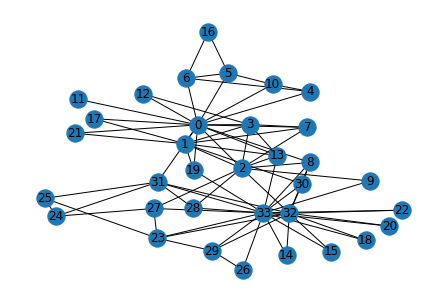

In [162]:
pos = nx.kamada_kawai_layout(g)
nx.draw(g, pos, with_labels=True)

We don't have any node features. So here we're creating a one-hot vector for each node based on its id. Together, it'd be a single identity matrix for the graph.

At the beginning, only the instructor and president nodes are labelled. Later on each person will join one of the groups headed by these two. So it's a binary classification, and the only labeled nodes we have are two.

In [177]:
node_features =  torch.eye(34) # torch.empty(34, 5).uniform_(0, 1).bernoulli() #
labeled_nodes = torch.tensor([0, 33])  # only the instructor and the president nodes are labeled
labels = torch.tensor([0, 1])

In [178]:
# since our code only works on adjacency matrix and not on edge-list

adj_matrix = torch.from_numpy(nx.adjacency_matrix(g).todense()).float()

In [200]:
# define our gcn model

model = GCNmodel(34, 32, 2)

In [201]:
# do a single pass just for a check

model(node_features, adj_matrix)

tensor([[0.0000, 0.0982],
        [0.0000, 0.0940],
        [0.0000, 0.1041],
        [0.0000, 0.0931],
        [0.0000, 0.0891],
        [0.0000, 0.0991],
        [0.0000, 0.1228],
        [0.0000, 0.0988],
        [0.0000, 0.1139],
        [0.0000, 0.1084],
        [0.0000, 0.1207],
        [0.0000, 0.1138],
        [0.0000, 0.1035],
        [0.0000, 0.1024],
        [0.0000, 0.0928],
        [0.0000, 0.1010],
        [0.0000, 0.1063],
        [0.0000, 0.1010],
        [0.0000, 0.1255],
        [0.0000, 0.1201],
        [0.0000, 0.1163],
        [0.0000, 0.1195],
        [0.0000, 0.1107],
        [0.0000, 0.1206],
        [0.0000, 0.1234],
        [0.0000, 0.1059],
        [0.0000, 0.1255],
        [0.0000, 0.1239],
        [0.0000, 0.1184],
        [0.0000, 0.1184],
        [0.0000, 0.1184],
        [0.0000, 0.1184],
        [0.0000, 0.1184],
        [0.0000, 0.1220]], grad_fn=<ReluBackward0>)

In [202]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
all_logits = []
for epoch in range(100):
    logits = model(node_features, adj_matrix)
    # we save the logits for visualization later
    all_logits.append(logits.detach())
    logp = F.log_softmax(logits, 1)
    # we only compute loss for labeled nodes
    loss = F.nll_loss(logp[labeled_nodes], labels)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    print('Epoch %d | Loss: %.4f' % (epoch, loss.item()))

Epoch 0 | Loss: 0.6887
Epoch 1 | Loss: 0.6823
Epoch 2 | Loss: 0.6756
Epoch 3 | Loss: 0.6704
Epoch 4 | Loss: 0.6653
Epoch 5 | Loss: 0.6592
Epoch 6 | Loss: 0.6529
Epoch 7 | Loss: 0.6465
Epoch 8 | Loss: 0.6396
Epoch 9 | Loss: 0.6320
Epoch 10 | Loss: 0.6239
Epoch 11 | Loss: 0.6151
Epoch 12 | Loss: 0.6064
Epoch 13 | Loss: 0.5973
Epoch 14 | Loss: 0.5878
Epoch 15 | Loss: 0.5783
Epoch 16 | Loss: 0.5686
Epoch 17 | Loss: 0.5585
Epoch 18 | Loss: 0.5482
Epoch 19 | Loss: 0.5382
Epoch 20 | Loss: 0.5281
Epoch 21 | Loss: 0.5182
Epoch 22 | Loss: 0.5085
Epoch 23 | Loss: 0.4990
Epoch 24 | Loss: 0.4899
Epoch 25 | Loss: 0.4810
Epoch 26 | Loss: 0.4725
Epoch 27 | Loss: 0.4642
Epoch 28 | Loss: 0.4560
Epoch 29 | Loss: 0.4477
Epoch 30 | Loss: 0.4397
Epoch 31 | Loss: 0.4331
Epoch 32 | Loss: 0.4267
Epoch 33 | Loss: 0.4204
Epoch 34 | Loss: 0.4143
Epoch 35 | Loss: 0.4082
Epoch 36 | Loss: 0.4037
Epoch 37 | Loss: 0.3994
Epoch 38 | Loss: 0.3952
Epoch 39 | Loss: 0.3911
Epoch 40 | Loss: 0.3873
Epoch 41 | Loss: 0.3837
Ep

In [214]:
import matplotlib.animation as animation
import matplotlib.pyplot as plt

def draw(i):
    cls1color = '#00FFFF'
    cls2color = '#FF00FF'
    pos = {}
    colors = []
    for v in range(34):
        pos[v] = all_logits[i][v].numpy()
        cls = pos[v].argmax()
        colors.append(cls1color if cls else cls2color)
    ax.cla()
    ax.axis('off')
    ax.set_title('Epoch: %d' % i)
    pos = nx.kamada_kawai_layout(g)
    nx.draw_networkx(g.to_undirected(), pos, node_color=colors,
            with_labels=True, node_size=300, ax=ax)

fig = plt.figure(dpi=150)
fig.clf()
ax = fig.subplots()
draw(0)  # draw the prediction of the first epoch
plt.close()


In [215]:
ani = animation.FuncAnimation(fig, draw, frames=len(all_logits), interval=200)

In [216]:
ani.save("karate.gif", writer="pillow")

In [217]:
from matplotlib import rc
rc('animation', html='jshtml')

In [218]:
ani